### Python Integration of Nikita full atlas of myeloid cells - python

Steps to run: 
1. input object (I have full and intersected genes, try both) **done**
2. Normalise Data **done**
3. Find Variable features **done**
4. Scale data **done**
5. Run PCA **done**
6. Find Neighbors **done**
7. Run UMAP - colour by dataset_id to show integration necessary **done**
8. perform integration - harmony **done**
9. Find neighbors **done**
10. Find clusters **done**
11. run UMAP **done**
12. visualise UMAP - colour by cancer_subtype, sample_type_major, clusters, dataset_id **done**
13. annotate clusters
14. overlay my sig **done**



### in this analysis using object containing all genes (NR_data_all.h5ad)

In [3]:
#pip install "tools"  

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.1/99.1 kB 17.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 25.0 MB/s eta 0:00:000m eta 0:00:01
  Created wheel for tools: filename=tools-0.1.9-py3-none-any.whl size=46730 sha256=ec1cb8701b0581d901f8311c250283b24d0fca13876a4c485157a61018ac9fbf
  Stored in directory: /home/s4436039/.cache/pip/wheels/21/c1/ce/3732acbc72a85e35b32ff9f725f0af08dad27d409e3ebfa9e0
  Created wheel for pytils: filename=pytils-0.4.1-py3-none-any.whl size=32868 sha256=dba01e451df2a366e2dc6388d7d704f03b4fec03eef968dafefe061e0ef5c836
  Stored in directory: /home/s4436039/.cache/pip/wheels/75/2a/25/dfcdc94033c8b2fed52c1525927e2d52a456343444de6bcb33
Successfully built tools pytils
Note: you may need to restart the kernel to use updated packages.


In [5]:
#pip install -qqq scanpy[leiden] sc-dandelion bbknn

Note: you may need to restart the kernel to use updated packages.


In [1]:
#load packages
import os
import tools
import scanpy as sc
import pandas as pd
import dandelion as ddl
from tqdm import tqdm

In [2]:
#show current directory 
os.getcwd()
os.chdir('/scratch/user/s4436039/scdata/Python_Integration')
os.getcwd()

'/scratch/user/s4436039/scdata/Python_Integration'

In [3]:
sc.logging.print_header()

scanpy==1.10.2 anndata==0.10.8 umap==0.5.6 numpy==1.26.4 scipy==1.14.0 pandas==2.2.2 scikit-learn==1.5.0 statsmodels==0.14.2 igraph==0.11.5 pynndescent==0.5.12


In [4]:
ddl.logging.print_header()

dandelion==0.3.8 pandas==2.2.2 numpy==1.26.4 matplotlib==3.9.2 networkx==3.3 scipy==1.14.0


In [5]:
sc.settings.set_figure_params(dpi=80, facecolor="white")

In [6]:
#read in the file
data = sc.read_h5ad('NR_data_all.h5ad')

In [8]:
data

AnnData object with n_obs × n_vars = 623908 × 74913
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample_type', 'cancer_type', 'patient_id', 'sample_id', 'percent.mt', 'site', 'sample_type_major', 'cancer_subtype', 'integration_id', 'ident', 'dataset_id'
    var: 'name'
    obsm: 'X_pca', 'X_umap'

In [10]:
#remove PCA and UMAP data done previously
# Remove PCA results
if 'X_pca' in data.obsm:
    del data.obsm['X_pca']
if 'pca' in data.uns:
    del data.uns['pca']
if 'PCs' in data.varm:
    del data.varm['PCs']

# Remove UMAP results
if 'X_umap' in data.obsm:
    del data.obsm['X_umap']
if 'umap' in data.uns:
    del data.uns['umap']

In [11]:
data

AnnData object with n_obs × n_vars = 623908 × 74913
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample_type', 'cancer_type', 'patient_id', 'sample_id', 'percent.mt', 'site', 'sample_type_major', 'cancer_subtype', 'integration_id', 'ident', 'dataset_id'
    var: 'name'

In [12]:
data.obs

,nCount_RNA,nFeature_RNA,sample_type,cancer_type,patient_id,sample_id,percent.mt,site,sample_type_major,cancer_subtype,integration_id,ident,dataset_id
GSE215120_AM1_AAACCTGGTTGCTCCT-1,20298.000000,3789.000000,tumour,Acral Melanoma,AM1,GSE215120_Acral_MEL_AM1,0.975466,skin,primary tumour,Acral Melanoma,GSE215120_Acral_MEL_AM1,all_integrated,GSE215120
GSE215120_AM1_AAAGATGTCCAAATGC-1,5574.000000,1721.000000,tumour,Acral Melanoma,AM1,GSE215120_Acral_MEL_AM1,6.045928,skin,primary tumour,Acral Melanoma,GSE215120_Acral_MEL_AM1,all_integrated,GSE215120
GSE215120_AM1_AAAGTAGTCGGTGTTA-1,13432.000000,2759.000000,tumour,Acral Melanoma,AM1,GSE215120_Acral_MEL_AM1,2.151578,skin,primary tumour,Acral Melanoma,GSE215120_Acral_MEL_AM1,all_integrated,GSE215120
GSE215120_AM1_AAATGCCCAGAGCCAA-1,17143.000000,2659.000000,tumour,Acral Melanoma,AM1,GSE215120_Acral_MEL_AM1,1.224990,skin,primary tumour,Acral Melanoma,GSE215120_Acral_MEL_AM1,all_integrated,GSE215120
GSE215120_AM1_AAATGCCGTTTGGCGC-1,3603.000000,1012.000000,tumour,Acral Melanoma,AM1,GSE215120_Acral_MEL_AM1,3.608104,skin,primary tumour,Acral Melanoma,GSE215120_Acral_MEL_AM1,all_integrated,GSE215120
...,...,...,...,...,...,...,...,...,...,...,...,...,...
GSE180661_HGSOC_SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY_TTTCGATGTGACGTCC,-4.871771,-10.337130,Adnexa,HGSOC,Left Adnexa,SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY,1541.000000,ovary,primary tumour,HGSOC,GSE180661_SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY,all_integrated,GSE180661
GSE180661_HGSOC_SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY_TTTCGATTCTGCGAGC,-4.766977,-8.292435,Adnexa,HGSOC,Left Adnexa,SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY,2596.000000,ovary,primary tumour,HGSOC,GSE180661_SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY,all_integrated,GSE180661
GSE180661_HGSOC_SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY_TTTGATCGTTGCTCCT,-4.133310,-8.758132,Adnexa,HGSOC,Left Adnexa,SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY,1200.000000,ovary,primary tumour,HGSOC,GSE180661_SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY,all_integrated,GSE180661
GSE180661_HGSOC_SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY_TTTGGAGGTACGACAG,-9.313746,-7.889039,Adnexa,HGSOC,Left Adnexa,SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY,3165.000000,ovary,primary tumour,HGSOC,GSE180661_SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY,all_integrated,GSE180661


In [13]:
data.var

,name
5S-rRNA,5S-rRNA
7SK,7SK
7SK.1,7SK.1
7SK.2,7SK.2
7SK.3,7SK.3
...,...
hsa-mir-423,hsa-mir-423
hsa-mir-490,hsa-mir-490
hsa-mir-7515,hsa-mir-7515
hsa-mir-8072,hsa-mir-8072


In [14]:
#tabulate number of cells per sample type/ site/ cancer type 
pd.crosstab(data.obs["dataset_id"], data.obs["cancer_subtype"])

cancer_subtype,Acral Melanoma,BRCA1 TNBC,Breast Cancer,Breast DCIS,Breast IDC,CRC,ER Breast Cancer,GAC,GBM,HCC,HER2 Breast Cancer,HGSOC,HNSCC,Melanoma,NA,NPC,NSCLC,PDAC,TNBC,iCCA
dataset_id,,,,,,,,,,,,,,,,,,,,
GSE112271,0,0,0,0,0,0,0,0,0,7452,0,0,0,0,0,0,0,0,0,0
GSE131907,0,0,0,0,0,0,0,0,0,0,0,0,0,0,16531,0,19993,0,0,0
GSE139324,0,0,0,0,0,0,0,0,0,0,0,0,8753,0,0,0,0,0,0,0
GSE154778,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1038,0,0
GSE154826,0,0,0,0,0,0,0,0,0,0,0,0,0,0,46248,0,33976,0,0,0
GSE156405,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3472,0,0
GSE161529,0,4838,0,0,0,0,10105,0,0,0,4016,0,0,0,876,0,0,0,1687,0
GSE162025,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2069,0,0,0,0
GSE162498,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2024,0,26757,0,0,0


In [15]:
pd.crosstab(data.obs["cancer_subtype"], data.obs["sample_type_major"])

sample_type_major,ascites,healthy,local recurrence,metastatic tumour,primary tumour
cancer_subtype,,,,,
Acral Melanoma,0,0,0,0,755
BRCA1 TNBC,0,0,0,0,4838
Breast Cancer,0,0,0,0,3066
Breast DCIS,0,0,0,0,12374
Breast IDC,0,0,0,1814,2467
CRC,0,0,0,1379,3463
ER Breast Cancer,0,0,0,827,10755
GAC,0,0,0,507,2802
GBM,0,0,0,0,38643


In [16]:
pd.crosstab(data.obs["site"], data.obs["sample_type_major"])

sample_type_major,ascites,healthy,local recurrence,metastatic tumour,primary tumour
site,,,,,
ascites fluid,39292,0,0,0,0
bladder,0,0,0,1257,0
bowel,0,0,0,17940,0
brain,0,0,0,15776,38643
breast,0,1034,0,0,47321
colon,0,1056,0,0,3463
head and neck,0,0,7694,0,46786
liver,0,4300,0,14151,21671
lung,0,64803,0,10312,70368


In [17]:
pd.crosstab(data.obs["cancer_subtype"], data.obs["site"])

site,ascites fluid,bladder,bowel,brain,breast,colon,head and neck,liver,lung,lymph node,nasopharynx,omentum,ovary,pancreas,peritoneum,pleura,skin,stomach,upper abdomen,vagina
cancer_subtype,,,,,,,,,,,,,,,,,,,,
Acral Melanoma,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,755,0,0,0
BRCA1 TNBC,0,0,0,0,4838,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Breast Cancer,0,0,0,0,3066,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Breast DCIS,0,0,0,0,12374,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Breast IDC,0,0,0,0,2467,0,0,0,0,1814,0,0,0,0,0,0,0,0,0,0
CRC,0,0,0,0,0,3463,0,0,0,0,0,0,0,0,1379,0,0,0,0,0
ER Breast Cancer,0,0,0,0,10755,0,0,0,0,827,0,0,0,0,0,0,0,0,0,0
GAC,0,0,0,0,0,0,0,163,0,0,0,0,344,0,0,0,0,2802,0,0
GBM,0,0,0,38643,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [18]:
## Repeating this as a percentage
# You'll just have the function that does row/row.sum(), and you use apply with axis=1 to apply it by row (or across and not within columns).

pd.crosstab(data.obs["cancer_subtype"], data.obs["site"]).apply(
    lambda row: row / row.sum() * 100, axis=1
)

site,ascites fluid,bladder,bowel,brain,breast,colon,head and neck,liver,lung,lymph node,nasopharynx,omentum,ovary,pancreas,peritoneum,pleura,skin,stomach,upper abdomen,vagina
cancer_subtype,,,,,,,,,,,,,,,,,,,,
Acral Melanoma,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,100.000000,0.00000,0.000000,0.000000
BRCA1 TNBC,0.000000,0.000000,0.000000,0.000000,100.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
Breast Cancer,0.000000,0.000000,0.000000,0.000000,100.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
Breast DCIS,0.000000,0.000000,0.000000,0.000000,100.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
Breast IDC,0.000000,0.000000,0.000000,0.000000,57.626723,0.000000,0.000000,0.000000,0.000000,42.373277,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
CRC,0.000000,0.000000,0.000000,0.000000,0.000000,71.520033,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,28.479967,0.000000,0.000000,0.00000,0.000000,0.000000
ER Breast Cancer,0.000000,0.000000,0.000000,0.000000,92.859610,0.000000,0.000000,0.000000,0.000000,7.140390,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
GAC,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.925960,0.000000,0.000000,0.0,0.000000,10.395890,0.000000,0.000000,0.000000,0.000000,84.67815,0.000000,0.000000
GBM,0.000000,0.000000,0.000000,100.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000


### Normalise data:

In [19]:
sc.pp.normalize_total(data, target_sum=1e4)

# Logarithmize the data:
sc.pp.log1p(data)

# check the object
data

AnnData object with n_obs × n_vars = 623908 × 74913
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample_type', 'cancer_type', 'patient_id', 'sample_id', 'percent.mt', 'site', 'sample_type_major', 'cancer_subtype', 'integration_id', 'ident', 'dataset_id'
    var: 'name'
    uns: 'log1p'

### Identify highly variable genes:

In [20]:
# (Expects logarithimised data)
sc.pp.highly_variable_genes(data, min_mean=0.0125, max_mean=3, min_disp=0.5)
data

AnnData object with n_obs × n_vars = 623908 × 74913
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample_type', 'cancer_type', 'patient_id', 'sample_id', 'percent.mt', 'site', 'sample_type_major', 'cancer_subtype', 'integration_id', 'ident', 'dataset_id'
    var: 'name', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'

In [21]:
# to see genes
data.var  # there is now a hvg column

,name,highly_variable,means,dispersions,dispersions_norm
5S-rRNA,5S-rRNA,False,1.000000e-12,NaN,NaN
7SK,7SK,False,4.368504e-05,2.020106,0.819816
7SK.1,7SK.1,False,2.933916e-06,0.604587,-0.699562
7SK.2,7SK.2,False,9.646134e-03,2.747597,1.600685
7SK.3,7SK.3,False,1.000000e-12,NaN,NaN
...,...,...,...,...,...
hsa-mir-423,hsa-mir-423,False,1.000000e-12,NaN,NaN
hsa-mir-490,hsa-mir-490,False,1.000000e-12,NaN,NaN
hsa-mir-7515,hsa-mir-7515,False,1.000000e-12,NaN,NaN
hsa-mir-8072,hsa-mir-8072,False,4.296587e-04,1.528312,0.291939


In [22]:
#to get structure of dataframe
data.var.info()
data.obs.info()

<class 'pandas.core.frame.DataFrame'>
Index: 74913 entries, 5S-rRNA to snoU13
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   name              74913 non-null  object 
 1   highly_variable   74913 non-null  bool   
 2   means             74913 non-null  float64
 3   dispersions       52924 non-null  float64
 4   dispersions_norm  52924 non-null  float32
dtypes: bool(1), float32(1), float64(2), object(1)
memory usage: 4.7+ MB
<class 'pandas.core.frame.DataFrame'>
Index: 623908 entries, GSE215120_AM1_AAACCTGGTTGCTCCT-1 to GSE180661_HGSOC_SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY_TTTGGTTGTGTACAGG
Data columns (total 13 columns):
 #   Column             Non-Null Count   Dtype   
---  ------             --------------   -----   
 0   nCount_RNA         623908 non-null  float64 
 1   nFeature_RNA       623908 non-null  float64 
 2   sample_type        623908 non-null  category
 3   cancer_type        623908 non-null

In [23]:
#to get number of HV genes (because the column "highly_variable" is a boolean vector - ie it gives True (1) or False (0), you can use sum function to know)
print(data.var.highly_variable.sum())

3147


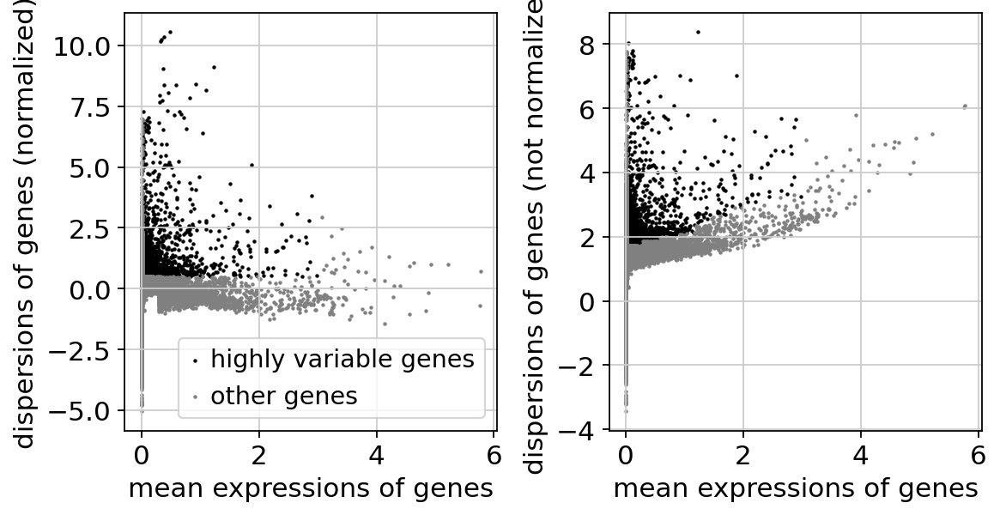

In [24]:
#plot out the number of highly variable genes
sc.pl.highly_variable_genes(data)

### Perform dimensionality reduction and scaling:

In [25]:
# Actually do the filtering for PCA
data = data[
    :, data.var.highly_variable
].copy()  # all rows/indexes : columns only selecting for those within high_variable, and then making a copy of itself
data

AnnData object with n_obs × n_vars = 623908 × 3147
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample_type', 'cancer_type', 'patient_id', 'sample_id', 'percent.mt', 'site', 'sample_type_major', 'cancer_subtype', 'integration_id', 'ident', 'dataset_id'
    var: 'name', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'

## next step: Regress out effects of "total_counts" per cell and percentage of mt genes expressed ("pct_counts_mt"). --> skipped this step as I believe already done for each dataset

``` python
sc.pp.regress_out(adata, ["total_counts", "pct_counts_mt"])

In [26]:
# Scale each gene to unit variance. Clip values exceeding std of 10.
sc.pp.scale(data, max_value=10)

In [27]:
## get PCA
sc.tl.pca(data, svd_solver="arpack")

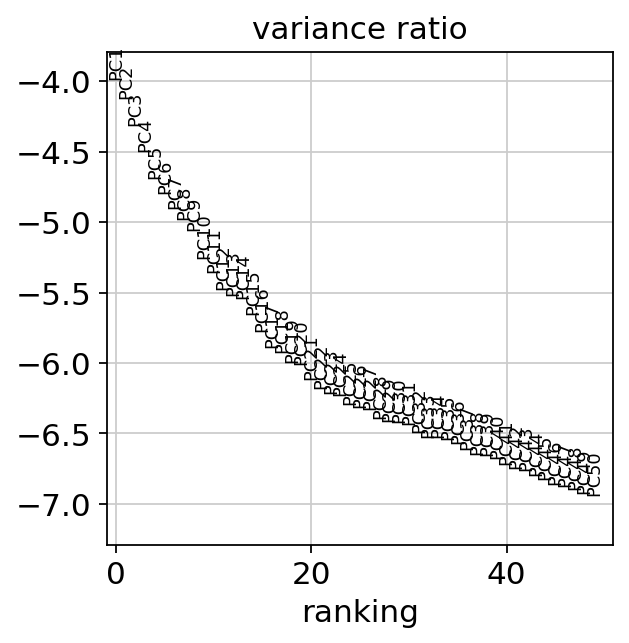

In [30]:
# get elbow plot to see variance contribution by each pc
sc.pl.pca_variance_ratio(data, log=True, n_pcs=50)

In [31]:
#at this point export out the object as the one we will use for integration
data_pre = data
data_pre.write_h5ad("data_all_pre-int.h5ad", compression="gzip")

### Perform neigborhood and UMAP on unintegrated data as comparison:

### Neighborhood graph:

In [32]:
## Computing neighbourhood graph - here UMAP
sc.pp.neighbors(data, n_neighbors=10, n_pcs=40)

## n_neighbor: The size of local neighborhood (in terms of number of neighboring data points) used for manifold approximation. Larger values result in more global views of the manifold, 
# while smaller values result in more local data being preserved. In general values should be in the range 2 to 100.
# If `knn` is `True`, number of nearest neighbors to be searched. If `knn` is `False`, a Gaussian kernel width is set to the distance of the `n_neighbors` neighbor.

### UMAP (~8min):

In [33]:
#Embedding the neighbourhood graph using UMAP
sc.tl.umap(data, min_dist=0.3)  # 0.3 is personal preference

### UMAP Visualisation:

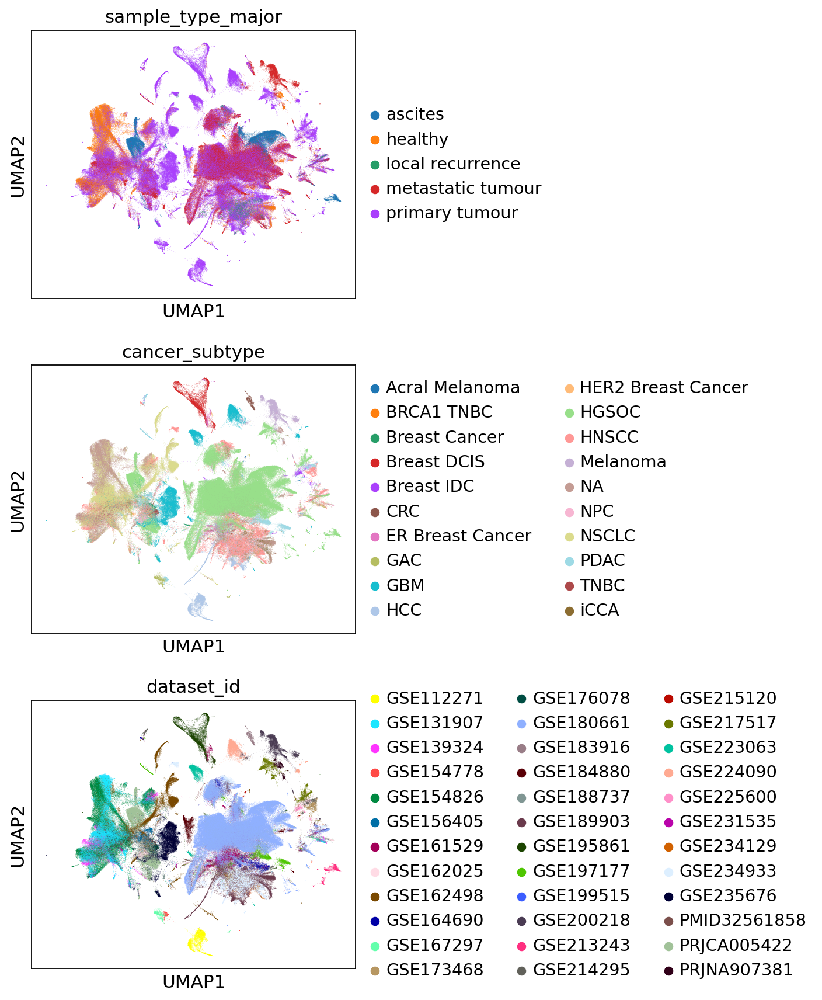

In [34]:
#visualise UMAP
sc.pl.umap(
    data,
    color=[
        "sample_type_major",
        "cancer_subtype",
        "dataset_id",
    ],
    ncols=1,
)

In [35]:
#write out the unintegrated object to be read in later if needed
data.write_h5ad("data_all_unintegrated.h5ad", compression="gzip")

In [6]:
#read in unintegrated for further adjusted UMAPS
data = sc.read_h5ad('data_i_unintegrated.h5ad')

In [36]:
import matplotlib.pyplot as plt

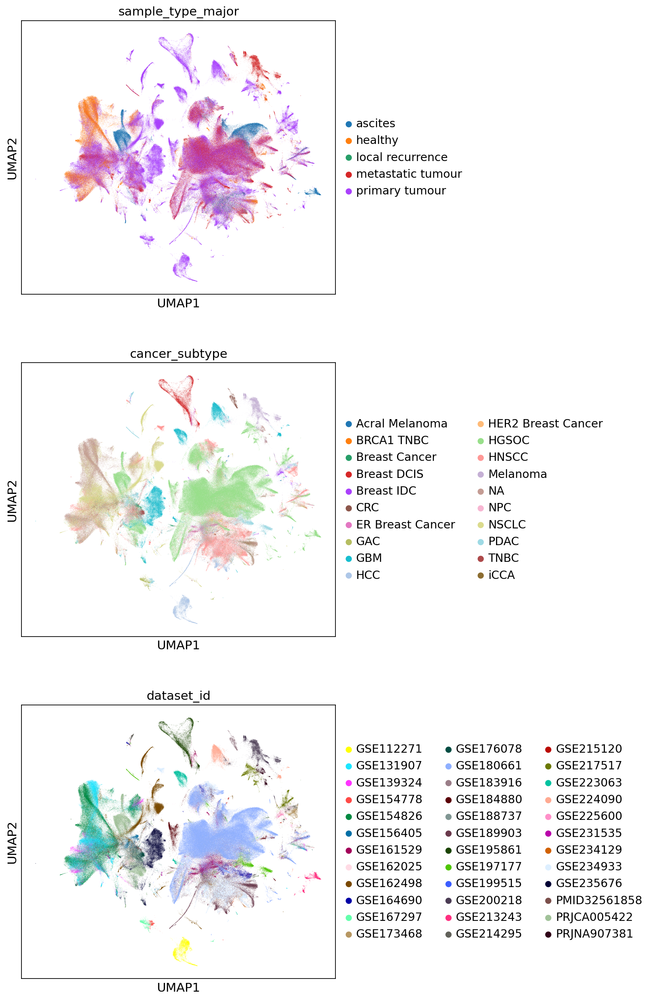

In [37]:
#visualise UMAP
with plt.rc_context({"figure.figsize": (6, 6)}):
    sc.pl.umap(
        data,
        color=[
            "sample_type_major",
            "cancer_subtype",
            "dataset_id",
        ],
        ncols=1,
    )

## Integration: 
#### want to perform integration after running PCA but before computing neighbor graph (on data_pre)

In [38]:
#read in the object we will use for integration (after PCA but before neighborhood graph) if needed
data_pre = sc.read_h5ad('data_all_pre-int.h5ad')

In [39]:
data_pre

AnnData object with n_obs × n_vars = 623908 × 3147
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample_type', 'cancer_type', 'patient_id', 'sample_id', 'percent.mt', 'site', 'sample_type_major', 'cancer_subtype', 'integration_id', 'ident', 'dataset_id'
    var: 'name', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'log1p', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

In [40]:
del data

In [41]:
import scanpy.external as sce

In [59]:
#pip install harmonypy

Note: you may need to restart the kernel to use updated packages.


#### ran below integration line for 83min and was only on iteration 2 of 10, so decided to submit as a job instead --> see 2024-08-28_Integration-script.py (script only took about 3.5hrs, but output says no convergence reached, not sure if that matters??)

In [60]:
#integrate based on column in data_pre.obs --> integration_id (unique per sample)
#sce.pp.harmony_integrate(data_pre, 'integration_id')

2024-08-28 12:15:41,300 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-08-28 12:17:38,497 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-08-28 12:17:47,926 - harmonypy - INFO - Iteration 1 of 10
2024-08-28 13:13:14,962 - harmonypy - INFO - Iteration 2 of 10


KeyboardInterrupt: 

In [6]:
#read in after integration
data_int = sc.read_h5ad('data_all_int.h5ad')

In [7]:
data_int.obsm

AxisArrays with keys: X_pca, X_pca_harmony

In [8]:
#check it made new column with adjusted harmony PCs
'X_pca_harmony' in data_int.obsm

True

In [9]:
#assign the new PCs to the standard PCA slot
data_int.obsm['X_pca'] = data_int.obsm['X_pca_harmony']

### Neighborhood graph:

In [10]:
## Computing neighbourhood graph - here UMAP
sc.pp.neighbors(data_int, n_neighbors=10, n_pcs=40)

### UMAP (~15min):

In [11]:
sc.tl.umap(data_int, min_dist=0.3)  # 0.3 is personal preference

### UMAP Visualisation:

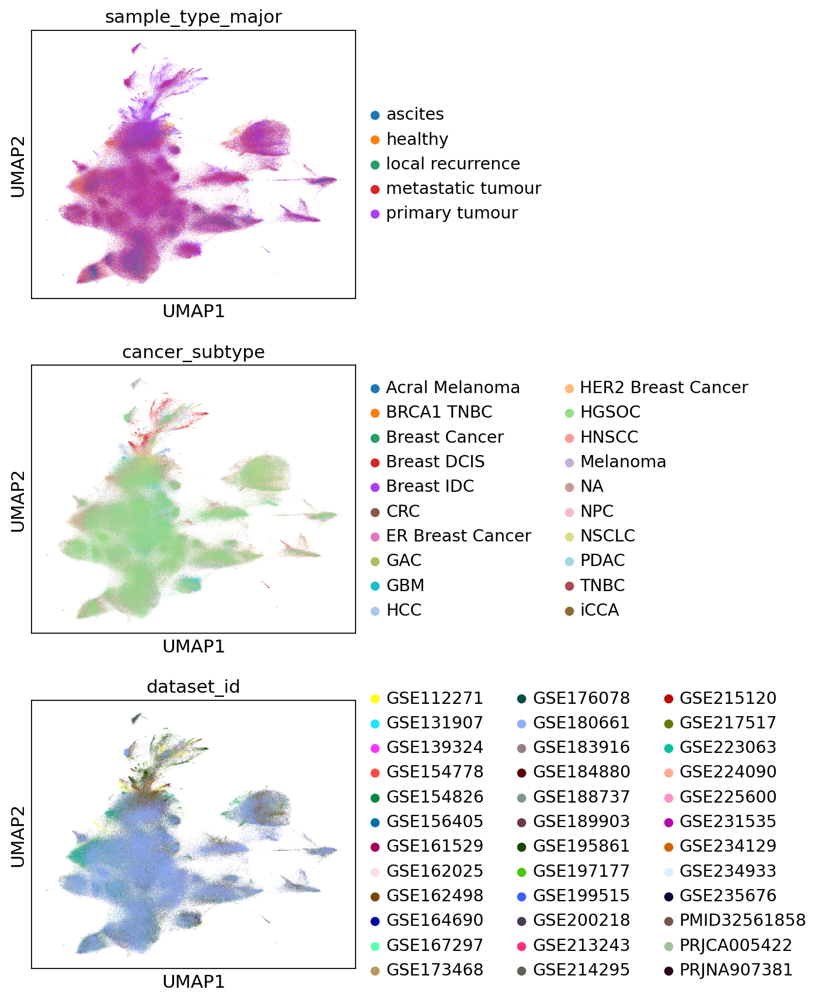

In [7]:
#same as above 
#visualise UMAP --> can see now integrated
sc.pl.umap(
    data_int,
    color=[
        "sample_type_major",
        "cancer_subtype",
        "dataset_id",
    ],
    ncols=1,
)

In [16]:
#split plot by sample_type_major, cancer_subtype etc

#define function
def cluster_small_multiples(
    data_int, clust_key, size=30, frameon=False, legend_loc=None, **kwargs
):
    tmp = data_int.copy()

    for i, clust in enumerate(data_int.obs[clust_key].cat.categories):
        tmp.obs[clust] = data_int.obs[clust_key].isin([clust]).astype("category")
        tmp.uns[clust + "_colors"] = ["#d3d3d3", data_int.uns[clust_key + "_colors"][i]]

    sc.pl.umap(
        tmp,
        groups=tmp.obs[clust].cat.categories[1:].values,
        color=data_int.obs[clust_key].cat.categories.tolist(),
        size=size,
        frameon=frameon,
        legend_loc=legend_loc,
        **kwargs
    )

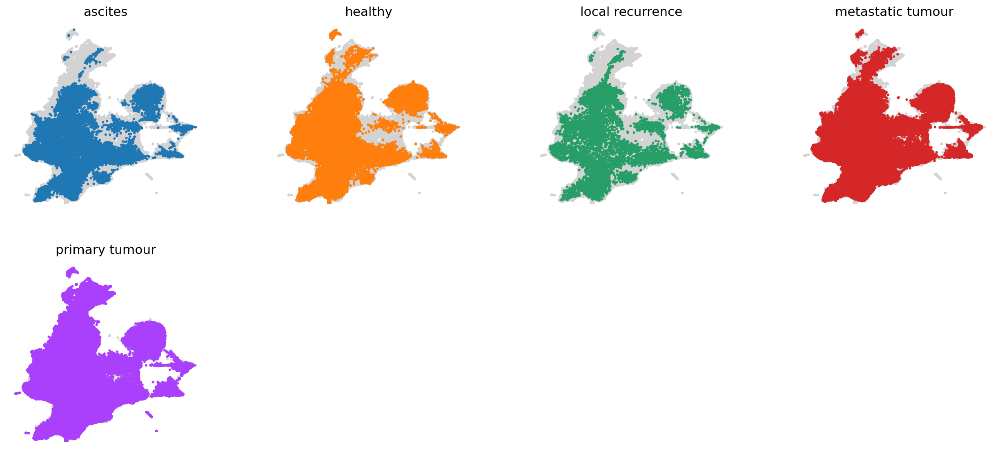

In [17]:
cluster_small_multiples(data_int, "sample_type_major")

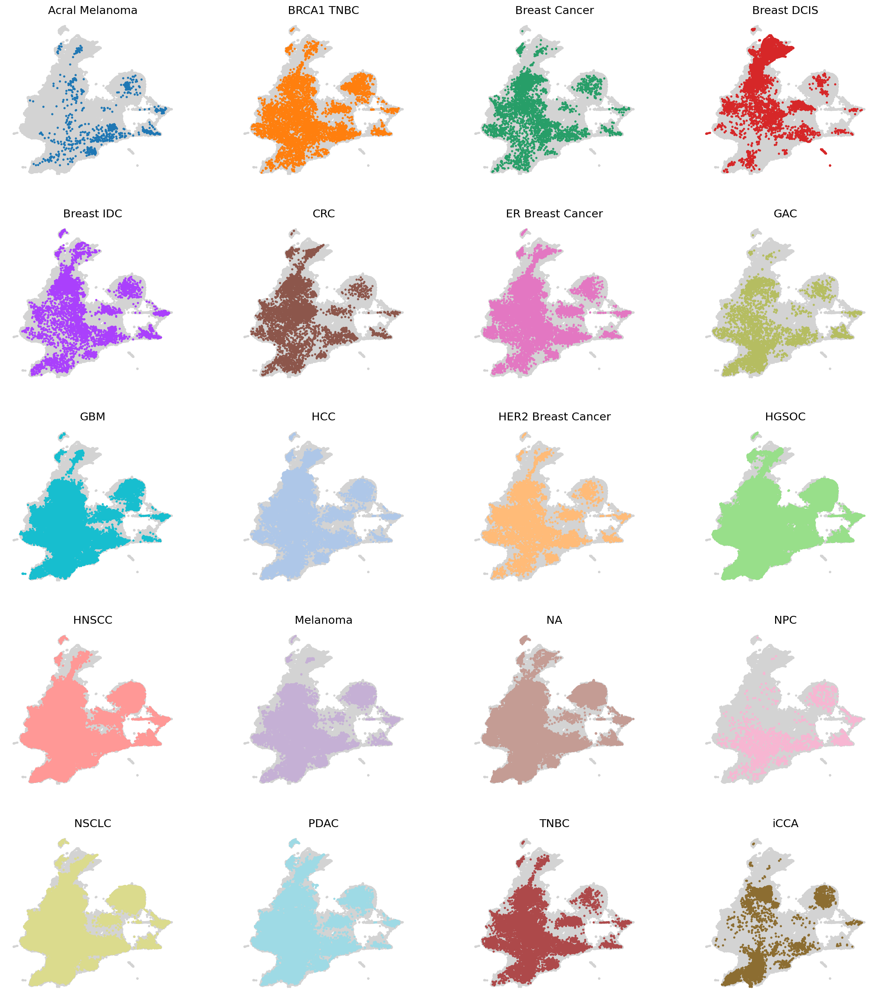

In [18]:
cluster_small_multiples(data_int, "cancer_subtype")

In [21]:
data_int

AnnData object with n_obs × n_vars = 623908 × 1634
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample_type', 'cancer_type', 'patient_id', 'sample_id', 'percent.mt', 'site', 'sample_type_major', 'cancer_subtype', 'integration_id', 'ident', 'dataset_id'
    var: 'name', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'log1p', 'pca', 'neighbors', 'umap', 'sample_type_major_colors', 'cancer_subtype_colors', 'dataset_id_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [22]:
data_int.write_h5ad("data_all_int2.h5ad", compression="gzip")

In [6]:
data_int = sc.read_h5ad('data_all_int2.h5ad')

### Clustering (20min):

In [8]:
sc.tl.leiden(data_int, resolution=0.2)

/scratch/temp/10354591/ipykernel_680163/965630358.py:1: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.


In [ ]:
data_int.write_h5ad("data_all_int3.h5ad", compression="gzip")

In [6]:
data_int = sc.read_h5ad('data_all_int3.h5ad')

### Visualising clusters:

In [9]:
import matplotlib.pyplot as plt

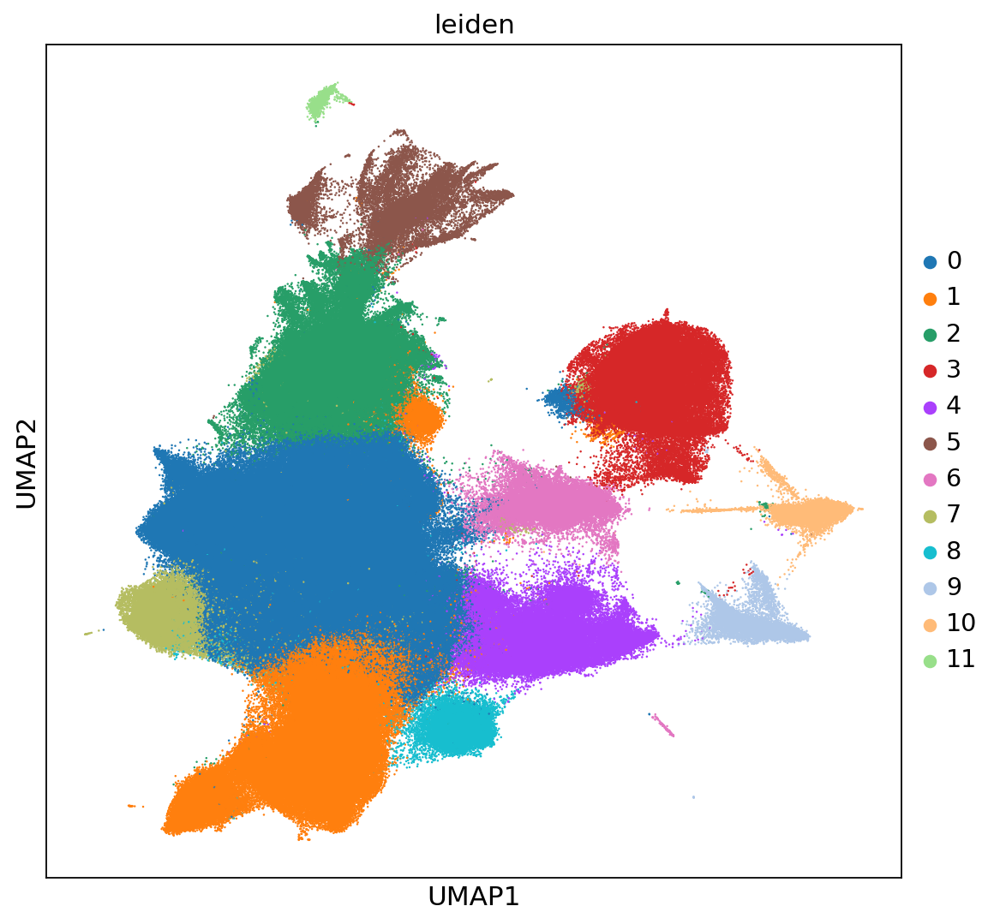

In [17]:
#plotting clusters
with plt.rc_context({"figure.figsize": (8, 8)}):
    sc.pl.umap(data_int, color="leiden", size=5)

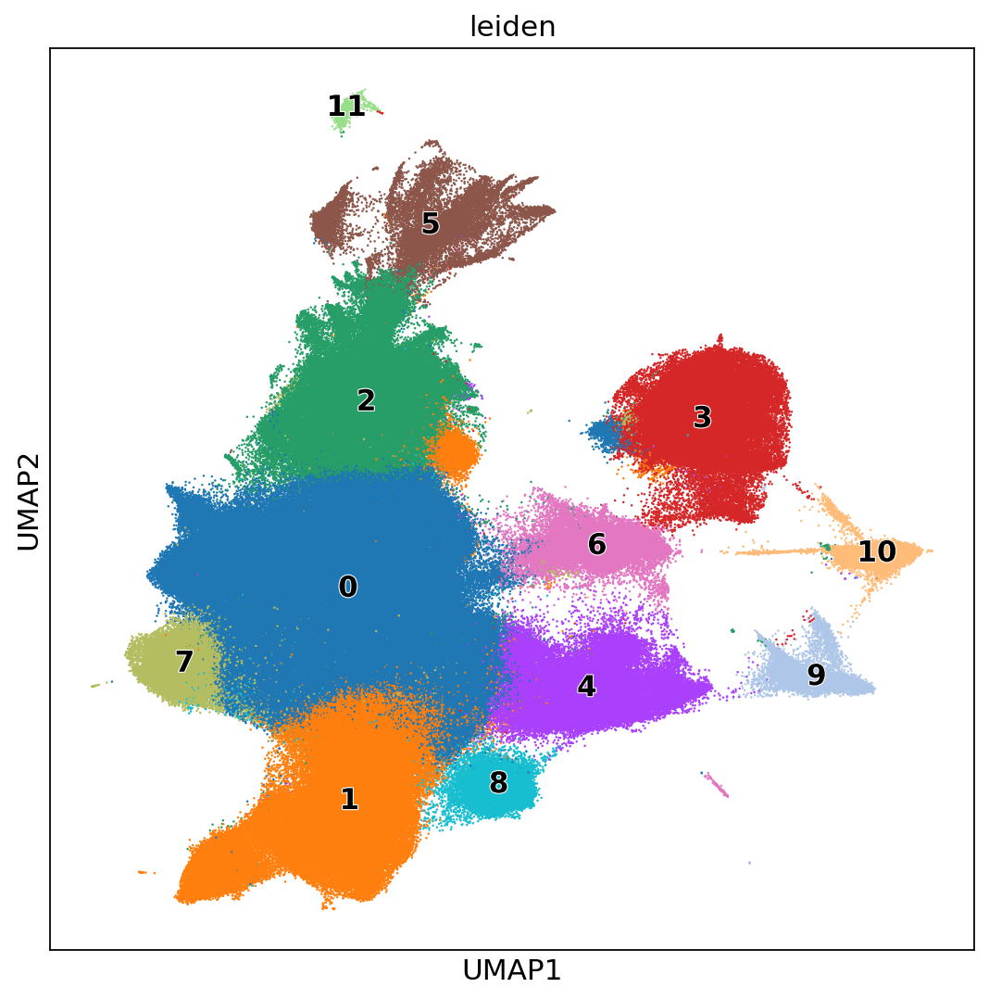

In [16]:
#plotting clusters
with plt.rc_context({"figure.figsize": (8, 8)}):
    sc.pl.umap(data_int, color="leiden", legend_loc="on data", legend_fontoutline=1, size=5)

In [38]:
#how many cells are there per cluster
data_int.obs.groupby(["leiden"]).apply(len)

/scratch/temp/10354639/ipykernel_1315532/3008939564.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
/scratch/temp/10354639/ipykernel_1315532/3008939564.py:2: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.


leiden
0     243198
1     110471
2      94572
3      49173
4      40338
5      19496
6      17703
7      15724
8      15189
9       8367
10      7303
11      2374
dtype: int64

In [39]:
import matplotlib.pyplot as plt

In [40]:
pd.crosstab(data_int.obs["sample_type_major"], data_int.obs["leiden"])

leiden,0,1,2,3,4,5,6,7,8,9,10,11
sample_type_major,,,,,,,,,,,,
ascites,11680,11606,6595,1175,5145,90,372,942,335,277,1069,6
healthy,30478,17955,11291,5873,3550,575,173,1066,1001,624,742,455
local recurrence,2044,1783,1198,533,677,112,281,247,211,463,139,6
metastatic tumour,67844,25567,16378,11474,9417,4055,6280,5812,3375,1457,1519,73
primary tumour,131152,53560,59110,30118,21549,14664,10597,7657,10267,5546,3834,1834


In [41]:
pd.crosstab(data_int.obs["sample_type_major"], data_int.obs["leiden"]).apply(
    lambda r: r / r.sum() * 100, axis=1
)

leiden,0,1,2,3,4,5,6,7,8,9,10,11
sample_type_major,,,,,,,,,,,,
ascites,29.726153,29.537819,16.784587,2.990431,13.094269,0.229054,0.946758,2.397435,0.852591,0.704978,2.720656,0.015270
healthy,41.307618,24.334874,15.302983,7.959828,4.811406,0.779312,0.234471,1.444777,1.356681,0.845723,1.005652,0.616673
local recurrence,26.566155,23.173902,15.570574,6.927476,8.799064,1.455680,3.652197,3.210294,2.742397,6.017676,1.806603,0.077983
metastatic tumour,44.269858,16.683089,10.687043,7.487064,6.144821,2.645986,4.097853,3.792471,2.202269,0.950728,0.991184,0.047634
primary tumour,37.483995,15.307756,16.893978,8.607897,6.158828,4.191055,3.028683,2.188415,2.934368,1.585079,1.095779,0.524168


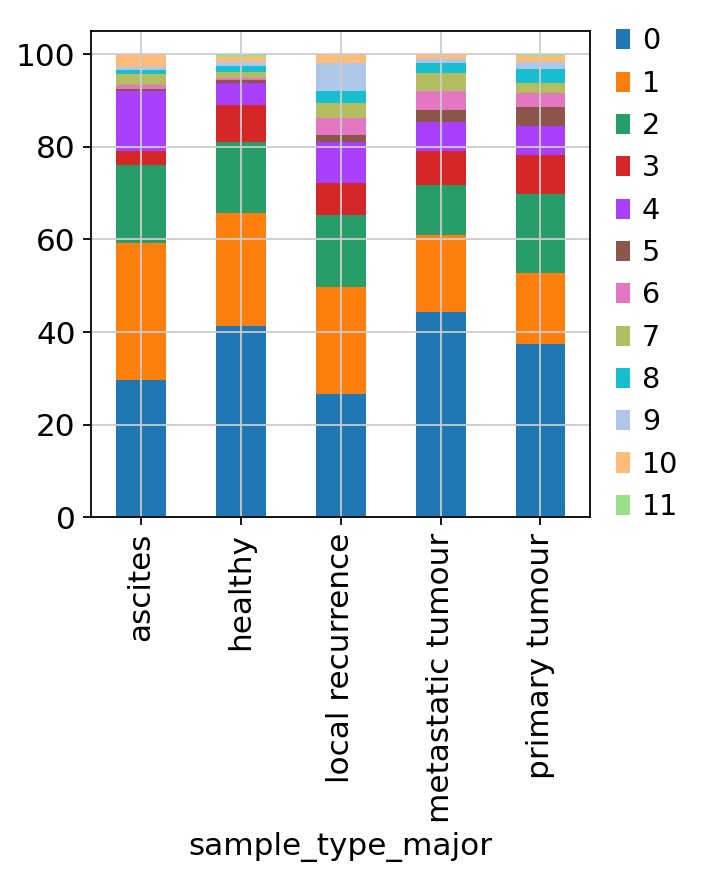

In [42]:
#### Creating a stacked bar
pd.crosstab(data_int.obs["sample_type_major"], data_int.obs["leiden"]).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True)
plt.legend(bbox_to_anchor=(1, 0.5), loc="center left", frameon=False)

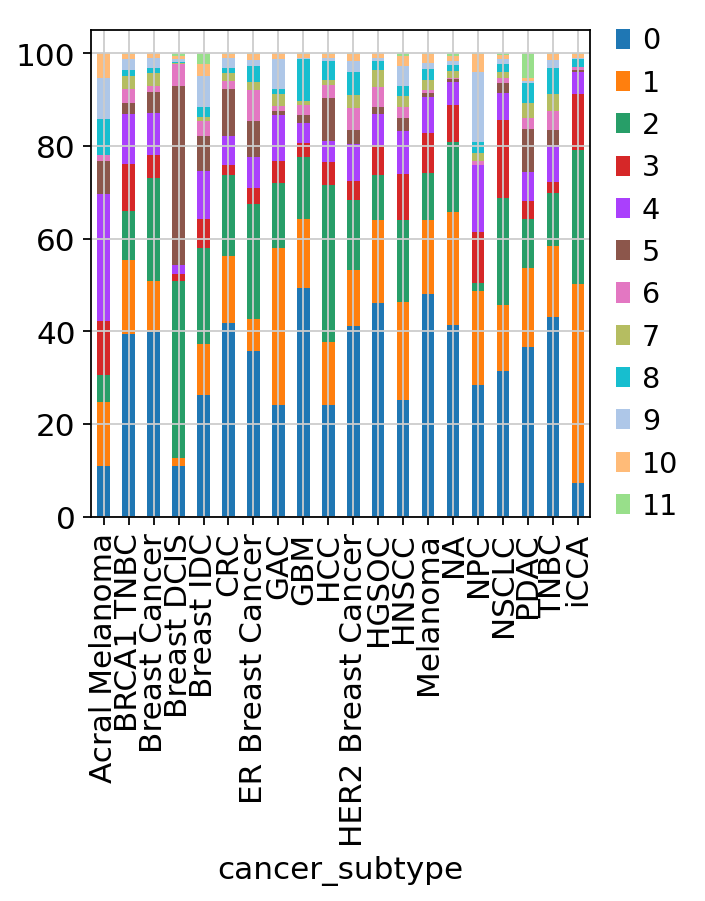

In [43]:
#### Creating a stacked bar
pd.crosstab(data_int.obs["cancer_subtype"], data_int.obs["leiden"]).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True)
plt.legend(bbox_to_anchor=(1, 0.5), loc="center left", frameon=False)

### Annotate clusters

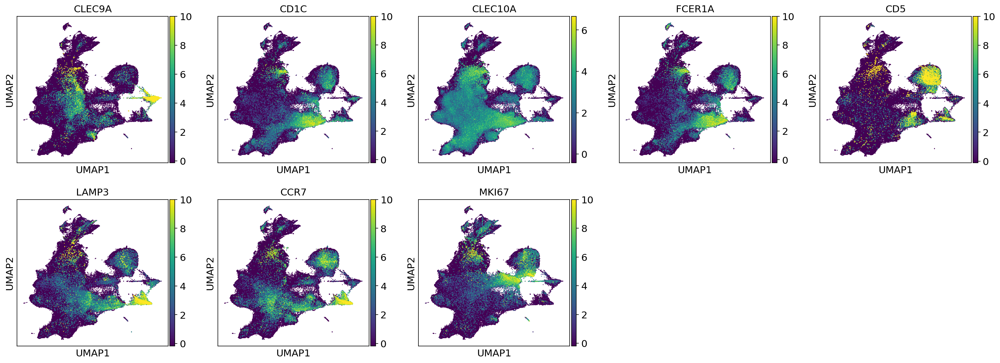

In [51]:
#plot DC/mac marker genes on UMAP 
sc.pl.umap(
    data_int,
    color=[
        "CLEC9A",
        "CD1C",
        "CLEC10A",
        "FCER1A",
        "CD5",
        "LAMP3",
        "CCR7",
        "MKI67",
    ],
    ncols=5,
    size=5,
)

#removed XCR1, CD163, CD14, CD274, FCGR1A, CD68, CD33, CSF1R, CD19, CD56, IL3RA, CLEC4C, HLA-DRA

In [ ]:
#plot DC/mac marker genes on dot plot - scanpy tute (mathod to make dot point with group labels for cell types)

In [44]:
#find DEG genes for each cluster: scanpy tute
# Obtain cluster-specific differentially expressed genes
sc.tl.rank_genes_groups(data_int, groupby="leiden", method="wilcoxon")

/home/s4436039/miniforge3/envs/env/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
/home/s4436039/miniforge3/envs/env/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
/home/s4436039/miniforge3/envs/env/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
/home/s4436039/miniforge3/envs/env/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
/home/s4436039/miniforge3/envs/env/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
/home/s4436039/miniforge3/envs/env/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
/home/s4436039/miniforge3/envs/env/lib/python3.12/site-packages/scanpy/tools

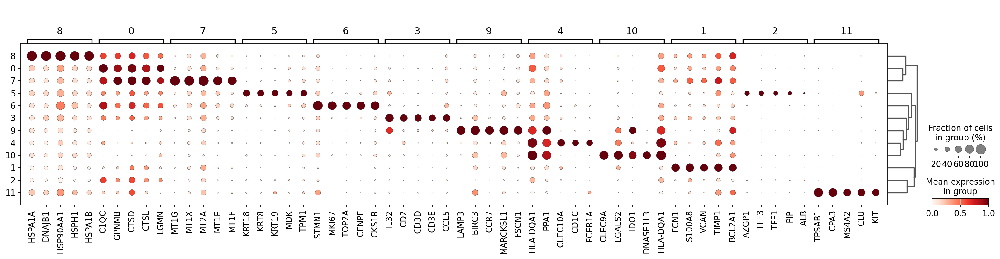

In [45]:
#visualise the top 5 DEG genes for each cluster
sc.pl.rank_genes_groups_dotplot(
    data_int, groupby="leiden", standard_scale="var", n_genes=5
)

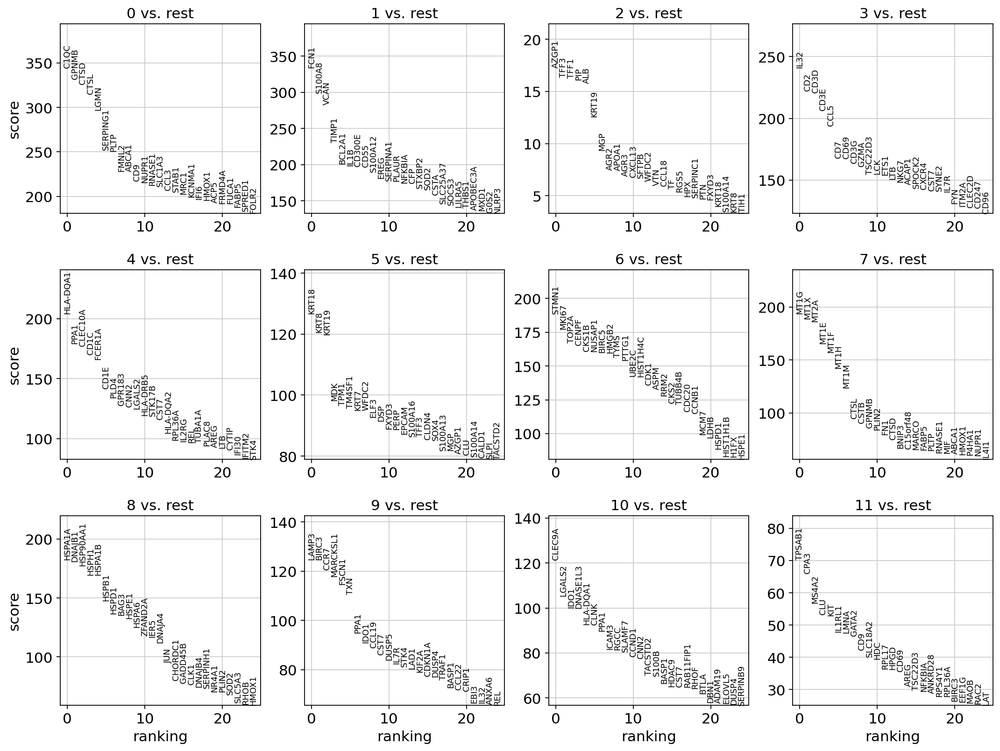

In [52]:
sc.pl.rank_genes_groups(data_int, n_genes=25, sharey=False)  # sharey means each panel

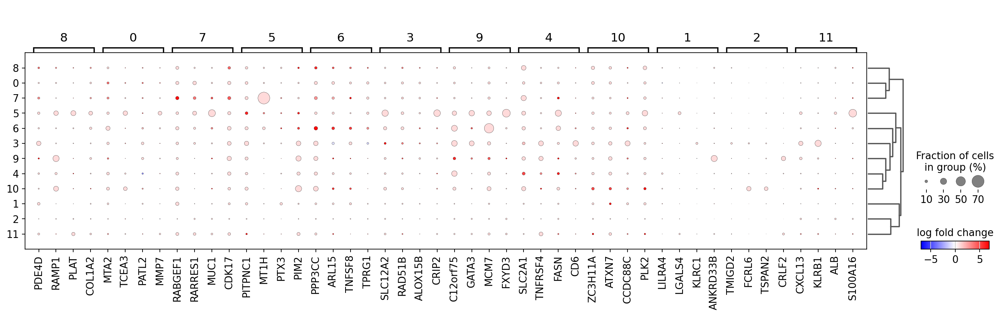

In [50]:
sc.pl.rank_genes_groups_dotplot(
    data_int,
    n_genes=4,
    values_to_plot="logfoldchanges",
    min_logfoldchange=3,
    vmax=7,
    vmin=-7,
    cmap="bwr",
)

In [ ]:
#export DEG genes for each cluster 

In [ ]:
#annotate clusters

In [ ]:
#plot cluster proportion by sample_type_major (ie. trying to see what clusters aren't present in healthy) - done above

### Overlay signature:

#### I think the scanpy equivalent of AddModuleScore in Seurat is sc.tl.score_genes, trying this

In [46]:
#define list of gene names used for score calculation

#make an object with my sigs - see excel file Nikita-mregDC_DEG_summary on i drive

Up_sig = ["CCL22","IL4I1","SIRPA","CCR7","CHST11","GPR157","RGS1","BIRC3","TRAF1","CSF2RA","TBC1D13","LAMP3","MREG","PPP1R14A","SPRED2","CD83","TXN","MOB3A","NFKB1","TBC1D4","CDK2","WFDC21P","ARAP2","ZER1","ACSL1","SPINT2","SQSTM1","TBC1D8","JAG1","AC073508.3","BATF","ETV3","BCL2","KIF2A","FSCN1","TNFAIP3","CCDC28B","NR4A3","CYTIP","PLEK","FOXO1","TOMM34","TRAFD1","PPP1R16B","CXCR4","CD40","ENTPD7","CDKN1A","BID","MARCKS","DUSP5","MAP4K4","BCL2L1","ISG20","RNF145","RNF121","GPR132","RASGEF1B","CYRIA","RAB10","CERS6","IL1R1","STK4","CLEC2D","AL390719.1","ZBTB38","IFNGR2","CD274","SLC41A2","NRP2","ANKRD33B","GPR183","POGLUT1","ADORA2A","JADE3","KHDRBS3","CTNNB1","SLCO5A1","NFKB2","RGS2","SEC61B","ZNRF1","RELB","C12orf45","IRF2","EPOP","MXD1","RAB5B","PADI2","DRAM1","MTMR4","EEF2K","GCNT2","RAPH1","BCL2A1","SEC23B","PIM3","ANTXR2","ABTB2","TMEM200A"]    

In [47]:
#score genes
sc.tl.score_genes(data_int, Up_sig)

       'CD83', 'MOB3A', 'TBC1D4', 'CDK2', 'WFDC21P', 'ARAP2', 'ZER1', 'SPINT2',
       'SQSTM1', 'TBC1D8', 'JAG1', 'AC073508.3', 'ETV3', 'BCL2', 'CCDC28B',
       'TOMM34', 'TRAFD1', 'CD40', 'ENTPD7', 'BID', 'MARCKS', 'BCL2L1',
       'RNF145', 'RNF121', 'RASGEF1B', 'CYRIA', 'RAB10', 'CERS6', 'AL390719.1',
       'ZBTB38', 'IFNGR2', 'CD274', 'SLC41A2', 'NRP2', 'POGLUT1', 'JADE3',
       'KHDRBS3', 'SLCO5A1', 'NFKB2', 'SEC61B', 'ZNRF1', 'RELB', 'C12orf45',
       'IRF2', 'EPOP', 'RAB5B', 'PADI2', 'DRAM1', 'MTMR4', 'EEF2K', 'GCNT2',
       'RAPH1', 'SEC23B', 'PIM3', 'ANTXR2', 'TMEM200A'],
      dtype='object')


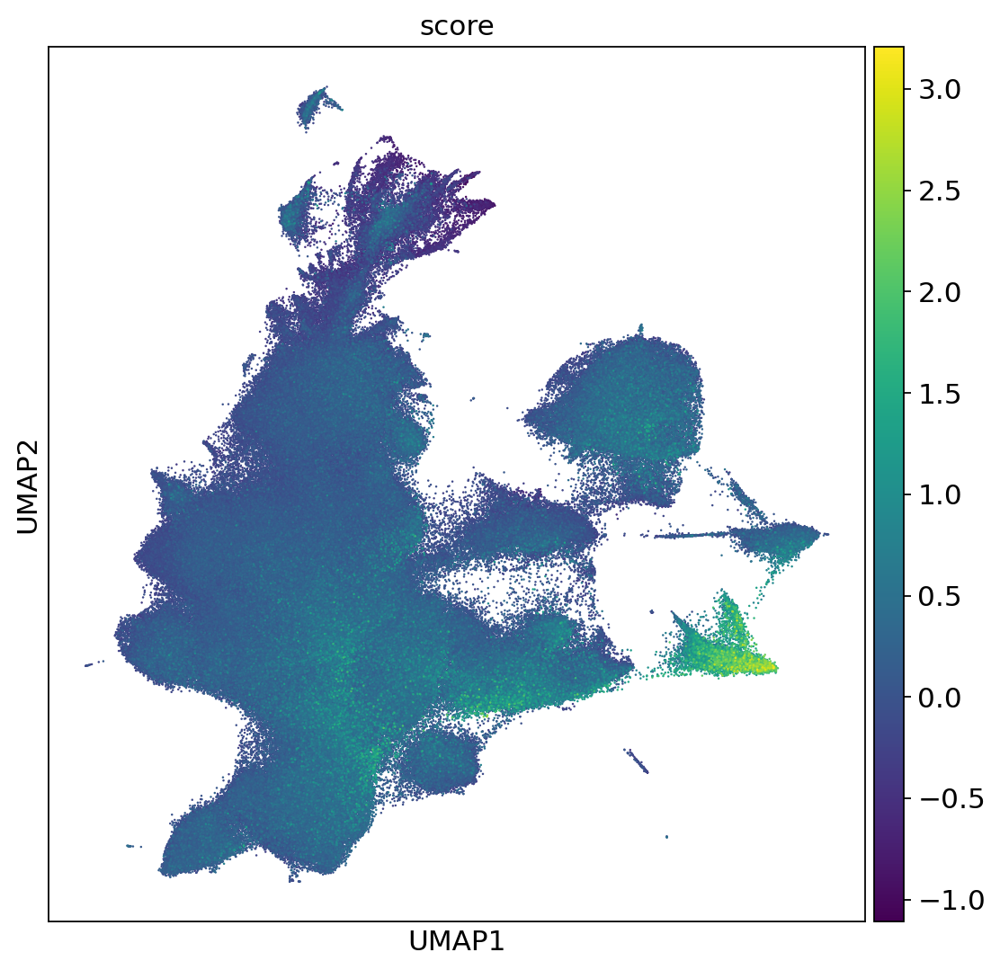

In [49]:
#plotting clusters
with plt.rc_context({"figure.figsize": (8, 8)}):
    sc.pl.umap(data_int, color="score", size=5)

In [53]:
data_int.write_h5ad("data_all_int4.h5ad", compression="gzip")

In [ ]:
data_int = sc.read_h5ad('data_all_int4.h5ad')

In [ ]:
#mregDC --> cluster 9, split plot by cancer type